In [1]:
import numpy as np
import pandas as pd
import os
import glob
from scipy import sparse
import collections

import matplotlib.pyplot as plt
import seaborn as sns

from dredFISH.Utils import __init__plots
from dredFISH.Utils import basicu

In [2]:
pth = '/bigstore/binfo/mouse/Brain/FISH/MERFISH_Fang2022_Science_CTX'
# !ls $pth
files = np.sort(glob.glob("mouse*", dir_fd=pth))
files

array(['mouse1.AUD_TEA_VIS.242.unexpand.barcodes.csv.gz',
       'mouse1.AUD_TEA_VIS.242.unexpand.features.csv',
       'mouse1.AUD_TEA_VIS.242.unexpand.genes.csv',
       'mouse1.AUD_TEA_VIS.242.unexpand.genes.v2.csv',
       'mouse1.AUD_TEA_VIS.242.unexpand.matrix.csv',
       'mouse2.AUD_TEA_VIS.242.unexpand.barcodes.csv.gz',
       'mouse2.AUD_TEA_VIS.242.unexpand.features.csv',
       'mouse2.AUD_TEA_VIS.242.unexpand.genes.csv',
       'mouse2.AUD_TEA_VIS.242.unexpand.genes.v2.csv',
       'mouse2.AUD_TEA_VIS.242.unexpand.matrix.csv'], dtype='<U47')

In [3]:
%%time
f = os.path.join(pth, "mouse1.AUD_TEA_VIS.242.unexpand.features.csv")
meta = pd.read_csv(f)
f = os.path.join(pth, "mouse1.AUD_TEA_VIS.242.unexpand.genes.v2.csv")
genes = pd.read_csv(f)['name'].values
f = os.path.join(pth, "mouse1.AUD_TEA_VIS.242.unexpand.matrix.csv")
mtx = pd.read_csv(f)
# f = os.path.join(pth, "mouse1.AUD_TEA_VIS.242.unexpand.barcodes.csv.gz")
# spots = pd.read_csv(f)
meta

CPU times: user 232 ms, sys: 72.8 ms, total: 305 ms
Wall time: 305 ms


,name,global.x,global.y,adjusted.x,adjusted.y,fov.x,fov.y,cluster_L1,cluster_L2,cluster_L3
0,fov_201_feature_1,-3408.476396,1289.825315,-3408.476396,1289.825315,1922.413292,164.049783,EXC,eL2/3.IT,eL2/3.IT.1
1,fov_202_feature_1,-3454.789690,1092.856622,-3454.789690,1092.856622,1497.520686,191.859933,EXC,eL2/3.IT,eL2/3.IT.1
2,fov_202_feature_11,-3441.307424,1128.932078,-3441.307424,1128.932078,1621.211194,522.827421,EXC,eL2/3.IT,eL2/3.IT.1
3,fov_202_feature_12,-3455.460129,1130.627496,-3455.460129,1130.627496,1491.369865,538.381719,EXC,eL2/3.IT,eL2/3.IT.1
4,fov_202_feature_14,-3419.537992,1144.648035,-3419.537992,1144.648035,1820.930753,667.010518,EXC,eL2/3.IT,eL2/3.IT.1
...,...,...,...,...,...,...,...,...,...,...
13217,fov_401_feature_73,-1339.942915,2556.751841,-1339.942915,2556.751841,716.298435,778.054607,lOGC,lOGC,lOGC
13218,fov_401_feature_8,-1298.422691,2507.721424,-1298.422691,2507.721424,1097.217925,328.234267,lASC,lASC,lASC
13219,fov_401_feature_85,-1401.446263,2640.863239,-1401.446263,2640.863239,152.047537,1549.718805,lOGC,lOGC,lOGC
13220,fov_401_feature_9,-1271.547703,2510.911698,-1271.547703,2510.911698,1343.777445,357.502832,lMGC,lASC,lASC


In [4]:
mtx

,row,col,val
0,9,1,1
1,13,1,1
2,18,1,1
3,19,1,1
4,21,1,2
...,...,...,...
869705,205,13222,1
869706,210,13222,1
869707,215,13222,1
869708,222,13222,3


In [5]:
# genes

In [6]:
counts = sparse.coo_matrix((mtx['val'].values, (mtx['row'].values-1, mtx['col'].values-1)), shape=(len(genes), len(meta)))
# m, n = counts.shape
# print(counts.nnz/(m*n))
counts = np.asarray(counts.todense())
counts

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [1, 9, 1, ..., 3, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [1, 6, 1, ..., 0, 0, 0]])

<AxesSubplot:xlabel='global.x', ylabel='global.y'>

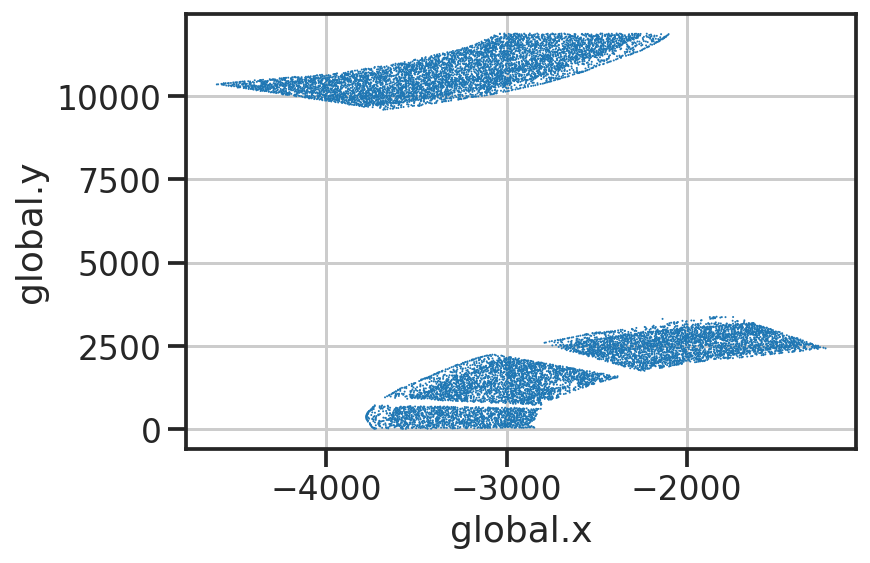

In [7]:
sns.scatterplot(data=meta, x='global.x', y='global.y', s=1, edgecolor='none')

In [8]:
metasub = meta[meta['global.y'] > 9000].copy()
metasub['cluster_L0'] = metasub['cluster_L1'].apply(lambda x: x if x in ['EXC', 'INC'] else "NonNeuronal")
metasub

,name,global.x,global.y,adjusted.x,adjusted.y,fov.x,fov.y,cluster_L1,cluster_L2,cluster_L3,cluster_L0
3956,fov_0_feature_10,-2350.964961,11643.875760,-2350.964961,11643.875760,362.253157,1618.024300,EXC,eL2/3.IT,eL2/3.IT.1,EXC
3957,fov_0_feature_26,-2371.821779,11568.357061,-2371.821779,11568.357061,170.906205,925.192203,EXC,eL2/3.IT,eL2/3.IT.1,EXC
3958,fov_0_feature_32,-2343.504670,11596.828818,-2343.504670,11596.828818,430.696199,1186.400977,EXC,eL2/3.IT,eL2/3.IT.1,EXC
3959,fov_0_feature_33,-2335.780869,11610.272280,-2335.780869,11610.272280,501.556759,1309.735490,EXC,eL2/3.IT,eL2/3.IT.1,EXC
3960,fov_0_feature_38,-2366.001665,11651.139310,-2366.001665,11651.139310,224.301751,1684.662374,EXC,eL2/3.IT,eL2/3.IT.4,EXC
...,...,...,...,...,...,...,...,...,...,...,...
12165,fov_9_feature_19,-2439.274456,11560.295417,-2439.274456,11560.295417,1386.936689,851.232167,lASC,lASC,lASC,NonNeuronal
12166,fov_9_feature_29,-2529.258073,11599.357251,-2529.258073,11599.357251,561.398925,1209.597614,oMURAL,oMURAL,oMURAL,NonNeuronal
12167,fov_9_feature_40,-2497.663338,11658.522847,-2497.663338,11658.522847,851.258874,1752.401243,lASC,lASC,lASC,NonNeuronal
12168,fov_9_feature_53,-2499.604328,11543.678261,-2499.604328,11543.678261,833.451632,698.781191,lMGC,lMGC,lMGC,NonNeuronal


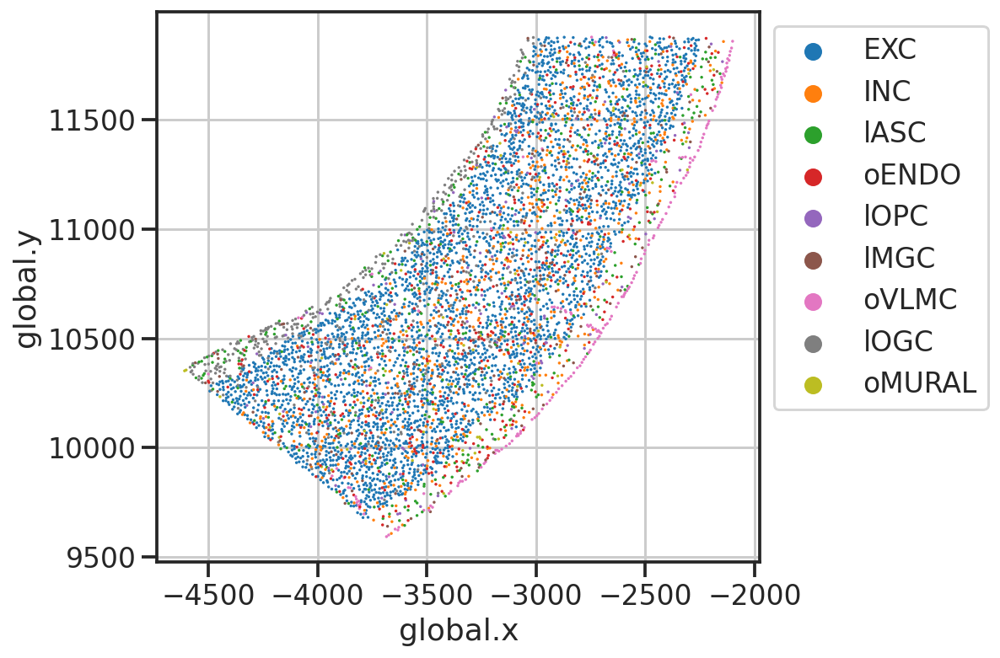

In [9]:
fig, ax = plt.subplots(figsize=(8,6))
sns.scatterplot(data=metasub, x='global.x', y='global.y', hue='cluster_L1', s=3, edgecolor='none', ax=ax)
ax.set_aspect('equal')
ax.legend(bbox_to_anchor=(1,1))

In [10]:
def rotmat_2d(theta):
    """theta in degree
    """
    t = np.radians(theta)
    mat = np.array([[np.cos(t), -np.sin(t)], 
                    [np.sin(t),  np.cos(t)],
          ])
    return mat
    

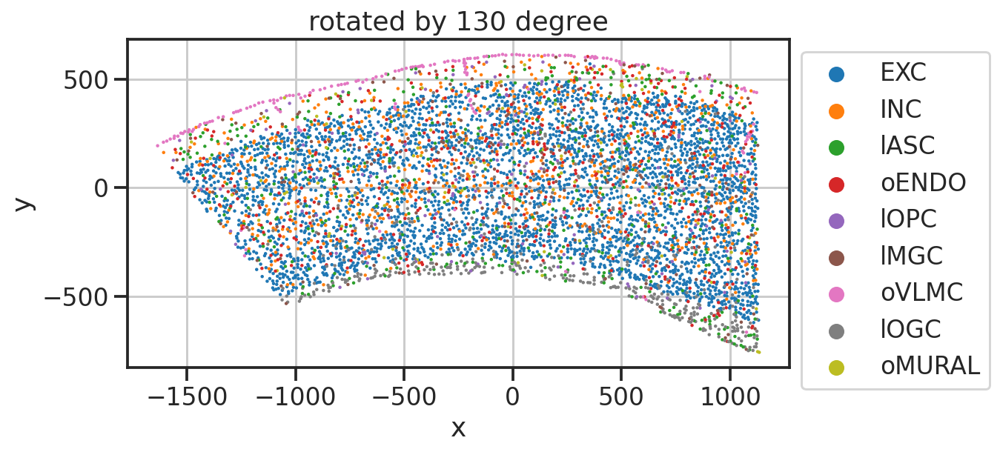

In [11]:
theta_trial = [130] # [110, 120, 130]

for theta in theta_trial:
    XY = metasub[['global.x', 'global.y']].values
    XY_r = XY - XY.mean(axis=0).reshape(1,-1)
    XY_r = XY_r.dot(rotmat_2d(theta).T)
    metasub[['x', 'y']] = XY_r

    fig, ax = plt.subplots(figsize=(8,6))
    sns.scatterplot(data=metasub, x='x', y='y', hue='cluster_L1', s=5, edgecolor='none', ax=ax)
    ax.set_aspect('equal')
    ax.set_title(f'rotated by {theta} degree')
    ax.legend(bbox_to_anchor=(1,1))

In [12]:
metasubsub = metasub[metasub['cluster_L1'] == "EXC"].copy()

In [13]:
exc_clsts = np.unique(metasubsub['cluster_L2'])
exc_clsts

array(['eL2/3.IT', 'eL4/5.IT', 'eL5.ET', 'eL5.IT', 'eL6.CAR3', 'eL6.CT',
       'eL6.IT', 'eL6b', 'eNP'], dtype=object)

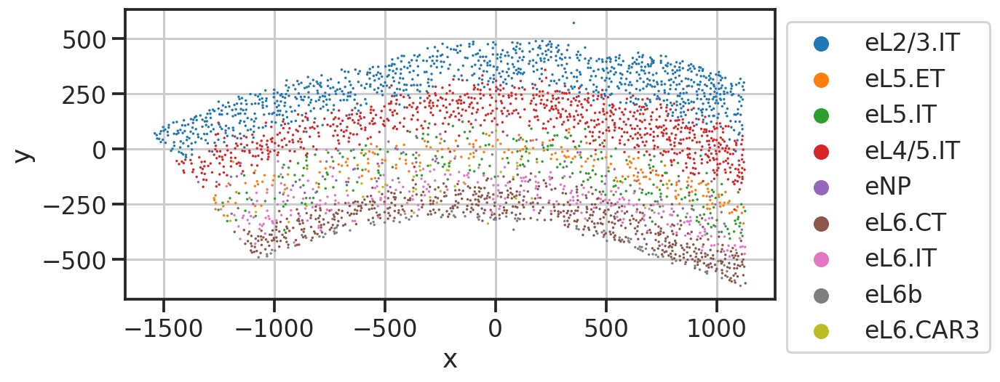

In [14]:
fig, ax = plt.subplots(figsize=(8,6))
sns.scatterplot(data=metasubsub, x='x', y='y', hue='cluster_L2', s=3, edgecolor='none', ax=ax)
ax.set_aspect('equal')
ax.legend(bbox_to_anchor=(1,1))

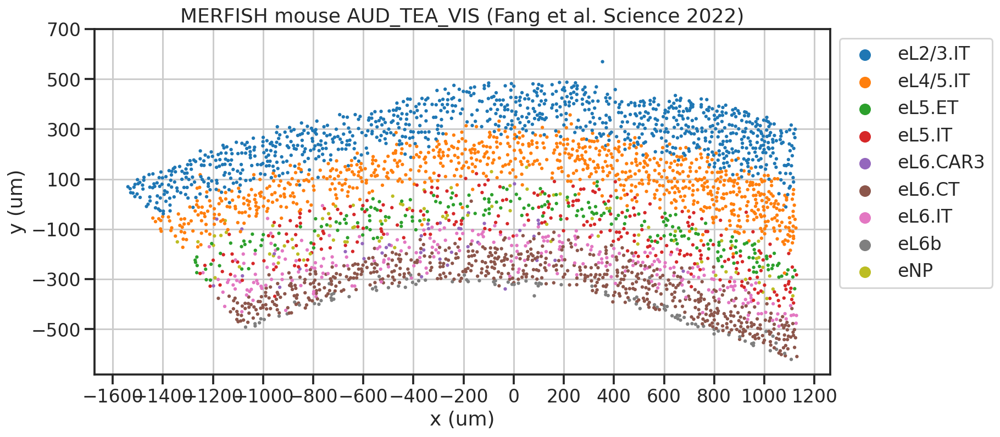

In [15]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=metasubsub, x='x', y='y', hue='cluster_L2', hue_order=exc_clsts, s=10, edgecolor='none', ax=ax)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'MERFISH mouse AUD_TEA_VIS (Fang et al. Science 2022)')
ax.set_xticks(np.arange(-1600, 1300, 200))
ax.set_yticks(np.arange(-500, 701, 200))
ax.legend(bbox_to_anchor=(1,1))

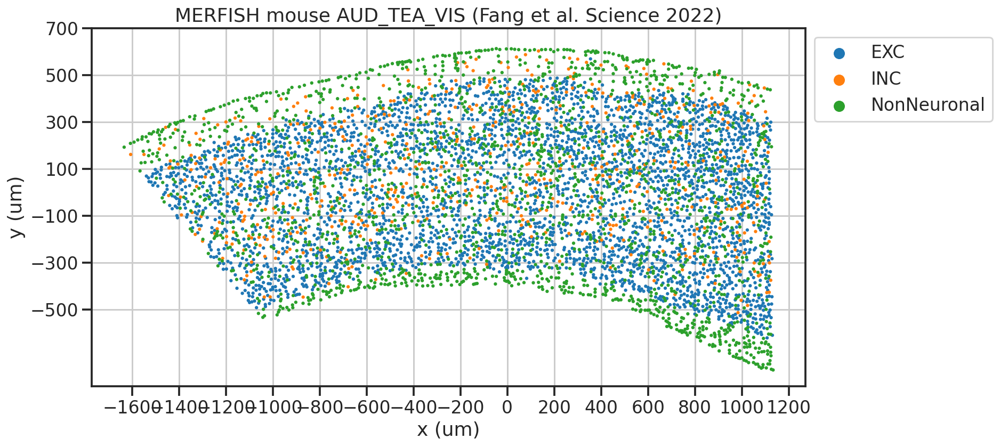

In [16]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=metasub, x='x', y='y', hue='cluster_L0', 
                # hue_order=exc_clsts, 
                s=10, edgecolor='none', ax=ax)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'MERFISH mouse AUD_TEA_VIS (Fang et al. Science 2022)')
ax.set_xticks(np.arange(-1600, 1300, 200))
ax.set_yticks(np.arange(-500, 701, 200))
ax.legend(bbox_to_anchor=(1,1))

In [17]:
metasub['cluster_hybrid'] = np.where(
    [x in exc_clsts for x in metasub['cluster_L2'].values], 
    metasub['cluster_L2'], 
    metasub['cluster_L0'])

In [18]:
metasub

,name,global.x,global.y,adjusted.x,adjusted.y,fov.x,fov.y,cluster_L1,cluster_L2,cluster_L3,cluster_L0,x,y,cluster_hybrid
3956,fov_0_feature_10,-2350.964961,11643.875760,-2350.964961,11643.875760,362.253157,1618.024300,EXC,eL2/3.IT,eL2/3.IT.1,EXC,-1307.666823,140.404730,eL2/3.IT
3957,fov_0_feature_26,-2371.821779,11568.357061,-2371.821779,11568.357061,170.906205,925.192203,EXC,eL2/3.IT,eL2/3.IT.1,EXC,-1236.409639,172.969964,eL2/3.IT
3958,fov_0_feature_32,-2343.504670,11596.828818,-2343.504670,11596.828818,430.696199,1186.400977,EXC,eL2/3.IT,eL2/3.IT.1,EXC,-1276.422157,176.360836,eL2/3.IT
3959,fov_0_feature_33,-2335.780869,11610.272280,-2335.780869,11610.272280,501.556759,1309.735490,EXC,eL2/3.IT,eL2/3.IT.1,EXC,-1291.685210,173.636320,eL2/3.IT
3960,fov_0_feature_38,-2366.001665,11651.139310,-2366.001665,11651.139310,224.301751,1684.662374,EXC,eL2/3.IT,eL2/3.IT.4,EXC,-1303.565618,124.217027,eL2/3.IT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12165,fov_9_feature_19,-2439.274456,11560.295417,-2439.274456,11560.295417,1386.936689,851.232167,lASC,lASC,lASC,NonNeuronal,-1186.876317,126.480141,NonNeuronal
12166,fov_9_feature_29,-2529.258073,11599.357251,-2529.258073,11599.357251,561.398925,1209.597614,oMURAL,oMURAL,oMURAL,NonNeuronal,-1158.959064,32.440229,NonNeuronal
12167,fov_9_feature_40,-2497.663338,11658.522847,-2497.663338,11658.522847,851.258874,1752.401243,lASC,lASC,lASC,NonNeuronal,-1224.591243,18.612288,NonNeuronal
12168,fov_9_feature_53,-2499.604328,11543.678261,-2499.604328,11543.678261,833.451632,698.781191,lMGC,lMGC,lMGC,NonNeuronal,-1135.367543,90.946080,NonNeuronal


In [19]:
metasub['cluster_hybrid2'] = np.where(
    [x.startswith('eL2/3') or x.startswith('eL4/5') for x in metasub['cluster_L2'].values], 
    metasub['cluster_L3'], 
    metasub['cluster_L0'])

In [20]:
metasub['cluster_L0'].unique()
metasub['cluster_hybrid'].unique()
metasub['cluster_hybrid2'].unique()

array(['eL2/3.IT.1', 'eL2/3.IT.4', 'eL2/3.IT.3', 'EXC', 'eL4/5.IT.2',
       'eL4/5.IT.4', 'eL4/5.IT.1', 'eL2/3.IT.2', 'eL4/5.IT.3', 'INC',
       'NonNeuronal'], dtype=object)

In [21]:
# colors = sns.color_palette('tab10', 9)
# palette = {}
# for clst, color in zip(np.unique(metasub['cluster_l2']), colors):
#     palette[clst] = color
# palette

colors = sns.color_palette('Paired', len(exc_clsts))
palette = collections.OrderedDict()
for clst, color in zip(exc_clsts, colors):
    palette[clst] = color
palette['INC'] = 'gray'
palette['NonNeuronal'] = 'lightgray'
hybrid_clsts = np.asarray(list(palette.keys()))



hybrid2_clsts = np.unique(metasub['cluster_hybrid2'])
hybrid2_exc_clsts = [c for c in hybrid2_clsts if c not in ['EXC', "INC", "NonNeuronal"]]
colors = sns.color_palette('Paired', len(hybrid2_exc_clsts))
palette2 = collections.OrderedDict()
for clst, color in zip(hybrid2_exc_clsts, colors):
    palette2[clst] = color
palette2['EXC'] = 'black'
palette2['INC'] = 'gray'
palette2['NonNeuronal'] = 'lightgray'
hybrid_clsts2 = np.asarray(list(palette2.keys()))


/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/seaborn/relational.py:657: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  args = np.asarray(x), np.asarray(y), np.asarray(s), np.asarray(c)


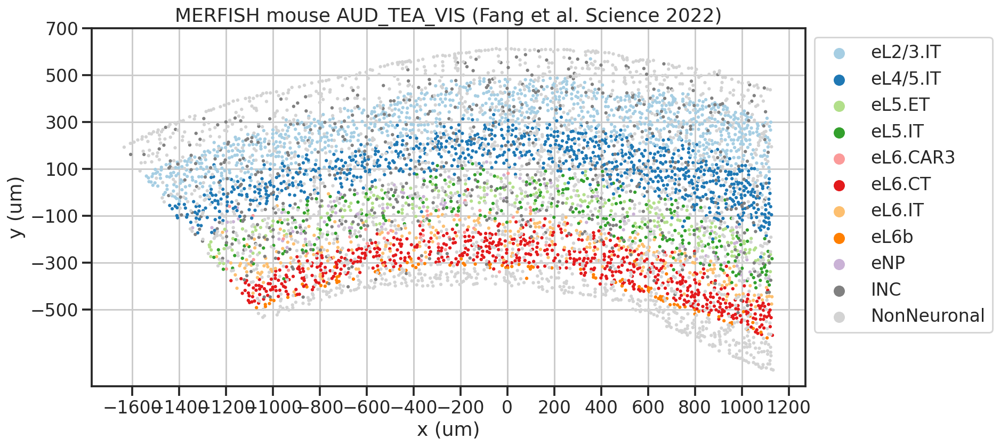

In [22]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=metasub, x='x', y='y', hue='cluster_hybrid', 
                hue_order=hybrid_clsts, 
                palette=palette,
                s=10, edgecolor='none', ax=ax)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'MERFISH mouse AUD_TEA_VIS (Fang et al. Science 2022)')
ax.set_xticks(np.arange(-1600, 1300, 200))
ax.set_yticks(np.arange(-500, 701, 200))
ax.legend(bbox_to_anchor=(1,1))

/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/seaborn/relational.py:657: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  args = np.asarray(x), np.asarray(y), np.asarray(s), np.asarray(c)


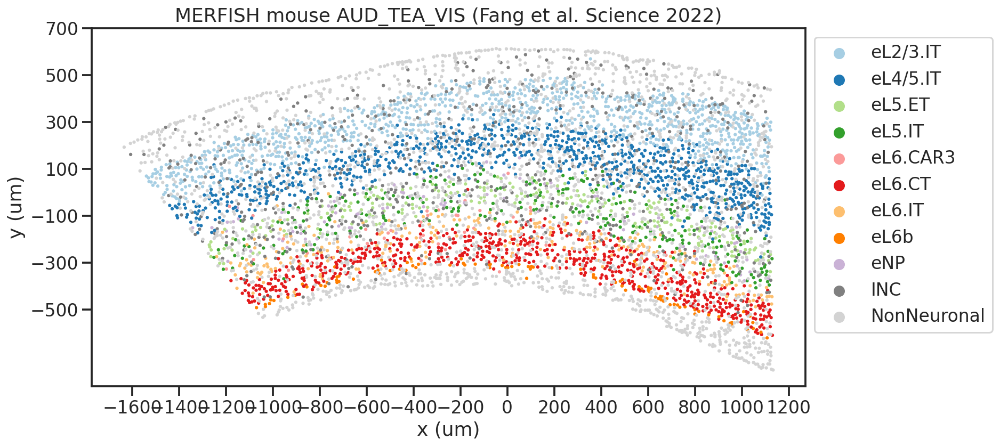

In [23]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=metasub, x='x', y='y', hue='cluster_hybrid', 
                hue_order=hybrid_clsts, 
                palette=palette,
                s=10, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'MERFISH mouse AUD_TEA_VIS (Fang et al. Science 2022)')
ax.set_xticks(np.arange(-1600, 1300, 200))
ax.set_yticks(np.arange(-500, 701, 200))
ax.legend(bbox_to_anchor=(1,1))

In [24]:
palette2

OrderedDict([('eL2/3.IT.1',
              (0.6509803921568628, 0.807843137254902, 0.8901960784313725)),
             ('eL2/3.IT.2',
              (0.12156862745098039, 0.47058823529411764, 0.7058823529411765)),
             ('eL2/3.IT.3',
              (0.6980392156862745, 0.8745098039215686, 0.5411764705882353)),
             ('eL2/3.IT.4', (0.2, 0.6274509803921569, 0.17254901960784313)),
             ('eL4/5.IT.1', (0.984313725490196, 0.6039215686274509, 0.6)),
             ('eL4/5.IT.2',
              (0.8901960784313725, 0.10196078431372549, 0.10980392156862745)),
             ('eL4/5.IT.3',
              (0.9921568627450981, 0.7490196078431373, 0.43529411764705883)),
             ('eL4/5.IT.4', (1.0, 0.4980392156862745, 0.0)),
             ('EXC', 'black'),
             ('INC', 'gray'),
             ('NonNeuronal', 'lightgray')])

/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/seaborn/relational.py:657: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  args = np.asarray(x), np.asarray(y), np.asarray(s), np.asarray(c)


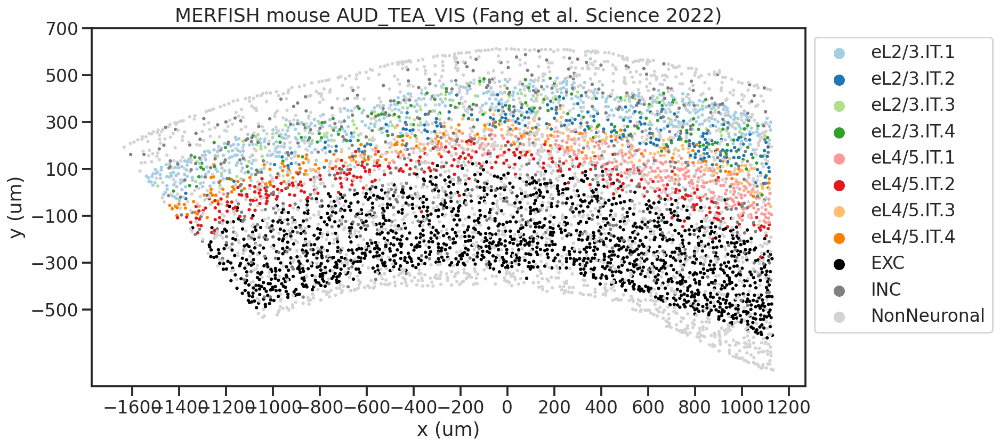

In [25]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=metasub, x='x', y='y', hue='cluster_hybrid2', 
                hue_order=hybrid_clsts2, 
                palette=palette2,
                s=10, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'MERFISH mouse AUD_TEA_VIS (Fang et al. Science 2022)')
ax.set_xticks(np.arange(-1600, 1300, 200))
ax.set_yticks(np.arange(-500, 701, 200))
ax.legend(bbox_to_anchor=(1,1))

In [26]:
from scipy import spatial
XY = metasub[['x', 'y']].values

In [27]:
hull = spatial.ConvexHull(XY)
hull.vertices

array([4505, 4131, 5741, 5353, 5332, 4788, 4796, 4798, 4757, 4759, 4334,
       4323, 4282, 4263, 4273, 5316, 5318, 4528, 4296, 3994, 5025, 5031,
       5033, 5037, 5039, 5062, 4007, 4123,  748, 4516], dtype=int32)

/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/seaborn/relational.py:657: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  args = np.asarray(x), np.asarray(y), np.asarray(s), np.asarray(c)


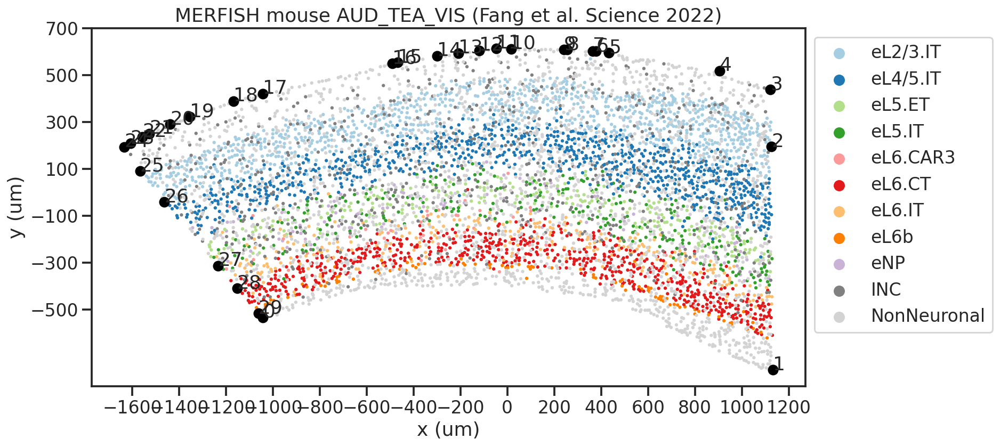

In [28]:
fig, ax = plt.subplots(figsize=(12,8))
for i, vtx in enumerate(hull.vertices):
    ax.plot(XY[vtx, 0], XY[vtx, 1], 'ok')
    ax.text(XY[vtx, 0], XY[vtx, 1], i)
    
sns.scatterplot(data=metasub, x='x', y='y', hue='cluster_hybrid', 
                hue_order=hybrid_clsts, 
                palette=palette,
                s=10, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'MERFISH mouse AUD_TEA_VIS (Fang et al. Science 2022)')
ax.set_xticks(np.arange(-1600, 1300, 200))
ax.set_yticks(np.arange(-500, 701, 200))
ax.legend(bbox_to_anchor=(1,1))

In [29]:
pia_vtx = hull.vertices[3:25]
pia_curve = XY[pia_vtx]
pia_curve[3:5,0]

array([378.80870189, 365.05997808])

/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/seaborn/relational.py:657: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  args = np.asarray(x), np.asarray(y), np.asarray(s), np.asarray(c)


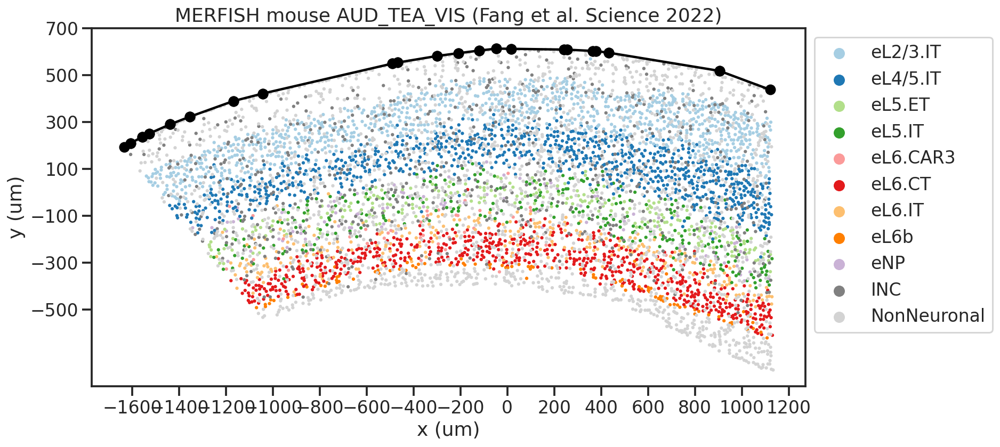

In [30]:
fig, ax = plt.subplots(figsize=(12,8))
for i in range(len(pia_curve)-1):
    ax.plot(pia_curve[i:i+2, 0], 
            pia_curve[i:i+2, 1], 
            '-ok')
    
sns.scatterplot(data=metasub, x='x', y='y', hue='cluster_hybrid', 
                hue_order=hybrid_clsts, 
                palette=palette,
                s=10, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'MERFISH mouse AUD_TEA_VIS (Fang et al. Science 2022)')
ax.set_xticks(np.arange(-1600, 1300, 200))
ax.set_yticks(np.arange(-500, 701, 200))
ax.legend(bbox_to_anchor=(1,1))

In [31]:
query_point = XY[0]

In [32]:
def p_to_curve(query_point, pia_curve):
    """
    """
    tan_vec = pia_curve[1:] - pia_curve[:-1]
    # unit
    tan_vec = tan_vec/np.linalg.norm(tan_vec, axis=1).reshape(-1,1)
    norm_vec = tan_vec.dot(np.array([[0,-1],[1,0]]).T)
    # np.power(tan_vec[:,0],2)+np.power(tan_vec[:,1],2) # check normed

    query_vec = (query_point - pia_curve[:-1])
    d = np.min(np.abs(query_vec[:,0]*norm_vec[:,0] + query_vec[:,1]*norm_vec[:,1]))
    return d

def ps_to_curve(query_points, pia_curve):
    """
    """
    tan_vec = pia_curve[1:] - pia_curve[:-1]
    # unit
    tan_vec = tan_vec/np.linalg.norm(tan_vec, axis=1).reshape(-1,1)
    norm_vec = tan_vec.dot(np.array([[0,-1],[1,0]]).T)
    
    query_mtx = np.repeat(XY[:,np.newaxis,:], len(pia_curve)-1, axis=1) - pia_curve[:-1]
    ds = np.min(np.abs(query_mtx[:,:,0]*norm_vec[:,0] + query_mtx[:,:,1]*norm_vec[:,1]), axis=1)
    return ds



In [33]:
print(p_to_curve(XY[0], pia_curve))
print(ps_to_curve(XY, pia_curve))

186.9265809679196
[186.92658097 180.88551036 164.14736555 ... 330.12780499 292.2758989
 264.58131474]


In [34]:
metasub['pia_depth'] = ps_to_curve(XY, pia_curve)

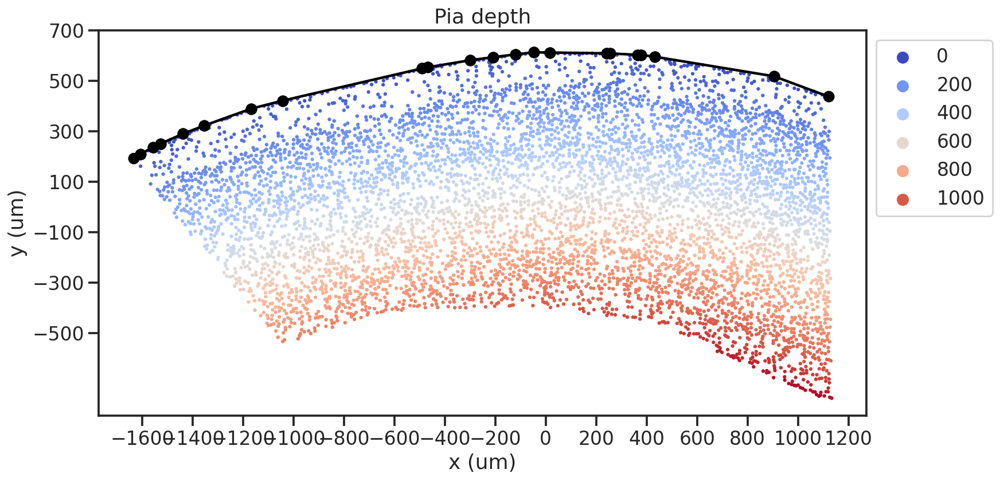

In [35]:
fig, ax = plt.subplots(figsize=(12,8))
for i in range(len(pia_curve)-1):
    ax.plot(pia_curve[i:i+2, 0], 
            pia_curve[i:i+2, 1], 
            '-ok')
    
sns.scatterplot(data=metasub, x='x', y='y', hue='pia_depth', 
                # hue_order=hybrid_clsts, 
                # palette=palette,
                palette='coolwarm',
                s=10, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'Pia depth')
ax.set_xticks(np.arange(-1600, 1300, 200))
ax.set_yticks(np.arange(-500, 701, 200))
ax.legend(bbox_to_anchor=(1,1))

In [36]:
val = metasub['pia_depth'].values
pia_bins = np.linspace(np.min(val), np.max(val), 50)
metasub['pia_depth_bin'] = pd.cut(val, bins=pia_bins)

metasub_typecounts = metasub.groupby(['pia_depth_bin', 'cluster_hybrid']).size().unstack()
metasub_typefrac_perbin  = metasub_typecounts.divide(metasub_typecounts.sum(axis=1), axis=0)
metasub_typefrac_pertype = metasub_typecounts.divide(metasub_typecounts.sum(axis=0), axis=1)
metasub_totalcounts = metasub.groupby(['pia_depth_bin']).size()

In [37]:
cond = ((metasub['x']>0) & (metasub['x']<400))
metasub2 = metasub[cond].copy()

metasub2_typecounts = metasub2.groupby(['pia_depth_bin', 'cluster_hybrid']).size().unstack()
metasub2_typefrac_perbin  = metasub2_typecounts.divide(metasub2_typecounts.sum(axis=1), axis=0)
metasub2_typefrac_pertype = metasub2_typecounts.divide(metasub2_typecounts.sum(axis=0), axis=1)
metasub2_totalcounts = metasub2.groupby(['pia_depth_bin']).size()

In [38]:
metasub3_typecounts = metasub.groupby(['pia_depth_bin', 'cluster_hybrid2']).size().unstack()
metasub3_typefrac_perbin  = metasub3_typecounts.divide(metasub3_typecounts.sum(axis=1), axis=0)
metasub3_typefrac_pertype = metasub3_typecounts.divide(metasub3_typecounts.sum(axis=0), axis=1)
metasub3_totalcounts = metasub.groupby(['pia_depth_bin']).size()

Text(0, 0.5, 'Fraction of cells\n(each cell type sums to 1)')

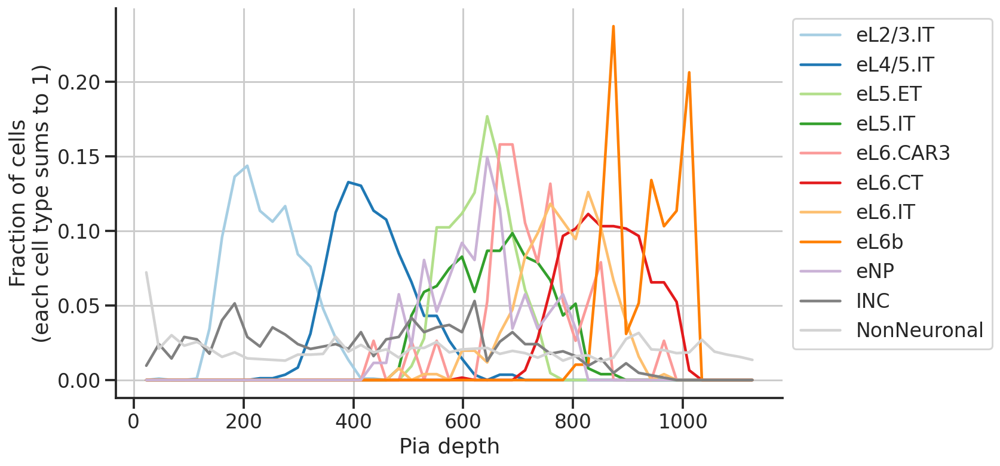

In [39]:
fig, ax = plt.subplots(figsize=(10,6))
for col in hybrid_clsts: #metasub_typefrac_pertype: 
    ax.plot(pia_bins[1:], metasub_typefrac_pertype[col].values, label=col, color=palette[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
ax.set_xlabel('Pia depth')
ax.set_ylabel('Fraction of cells\n(each cell type sums to 1)')

Text(0, 0.5, 'Fraction of cells\n(each spatial location sums to 1)')

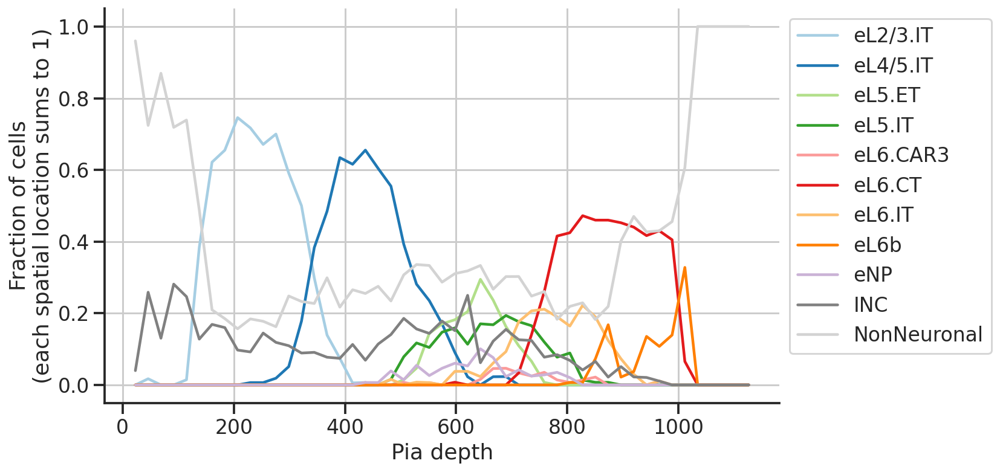

In [40]:
fig, ax = plt.subplots(figsize=(10,6))
for col in hybrid_clsts: #metasub_typefrac_perbin: 
    ax.plot(pia_bins[1:], metasub_typefrac_perbin[col].values, label=col, color=palette[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
ax.set_xlabel('Pia depth')
ax.set_ylabel('Fraction of cells\n(each spatial location sums to 1)')

Text(0, 0.5, 'Fraction of cells')

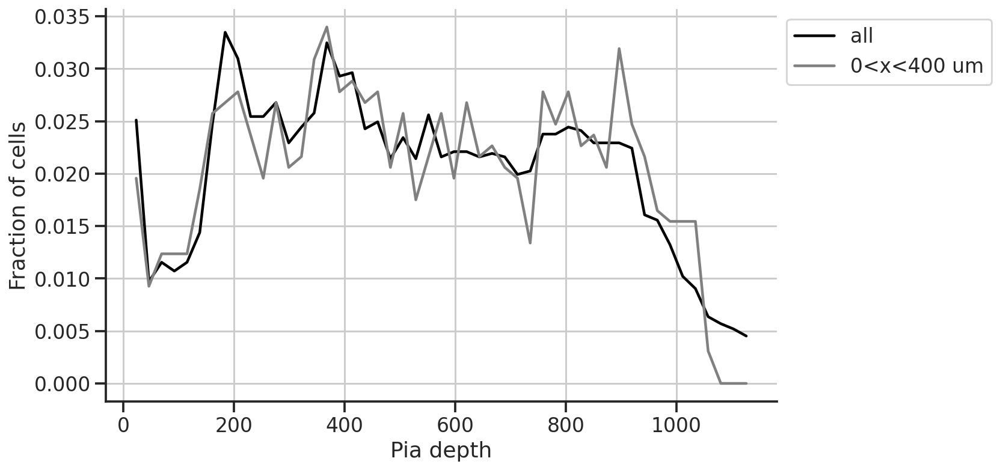

In [41]:

fig, ax = plt.subplots(figsize=(10,6))
ax.plot(pia_bins[1:], metasub_totalcounts /metasub_totalcounts.sum() , '-k', label='all') #, label=col, color=palette[col])
ax.plot(pia_bins[1:], metasub2_totalcounts/metasub2_totalcounts.sum(), '-', color='gray', label='0<x<400 um', ) #, label=col, color=palette[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
ax.set_xlabel('Pia depth')
ax.set_ylabel('Fraction of cells')

Text(0, 0.5, 'Cell type composition\n per spatial location')

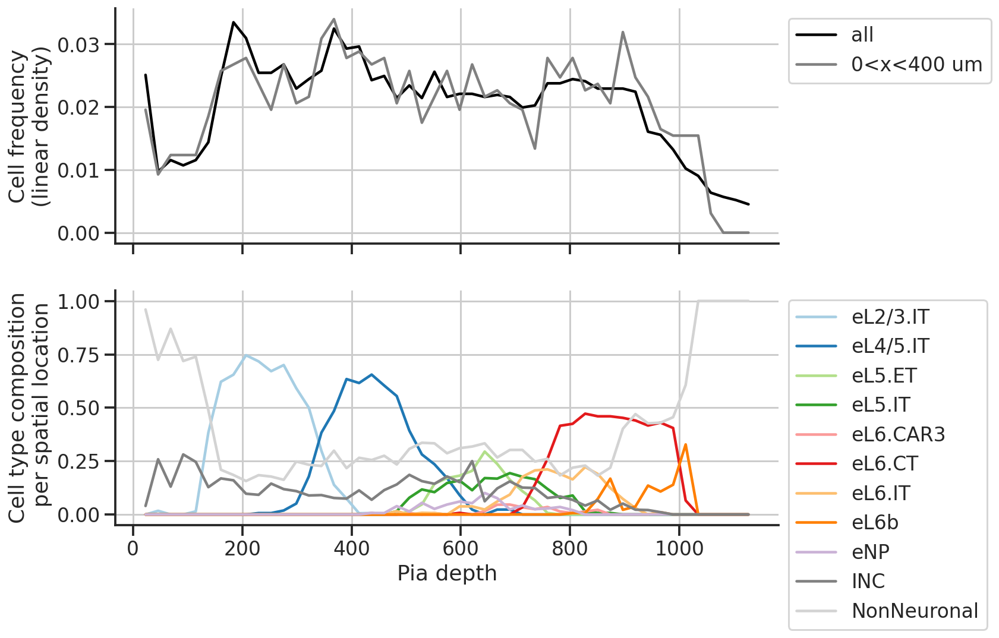

In [42]:
fig, axs = plt.subplots(2, 1, figsize=(10,4*2), sharex=True)
ax = axs[0]
ax.plot(pia_bins[1:], metasub_totalcounts /metasub_totalcounts.sum() , '-k', label='all') #, label=col, color=palette[col])
ax.plot(pia_bins[1:], metasub2_totalcounts/metasub2_totalcounts.sum(), '-', color='gray', label='0<x<400 um', ) #, label=col, color=palette[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
# ax.set_xlabel('Pia depth')
ax.set_ylabel('Cell frequency\n(linear density)')

ax = axs[1]
for col in hybrid_clsts: #metasub_typefrac_perbin: 
    ax.plot(pia_bins[1:], metasub_typefrac_perbin[col].values, label=col, color=palette[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
ax.set_xlabel('Pia depth')
ax.set_ylabel('Cell type composition\n per spatial location')

Text(0, 0.5, 'Cell type composition\n per spatial location')

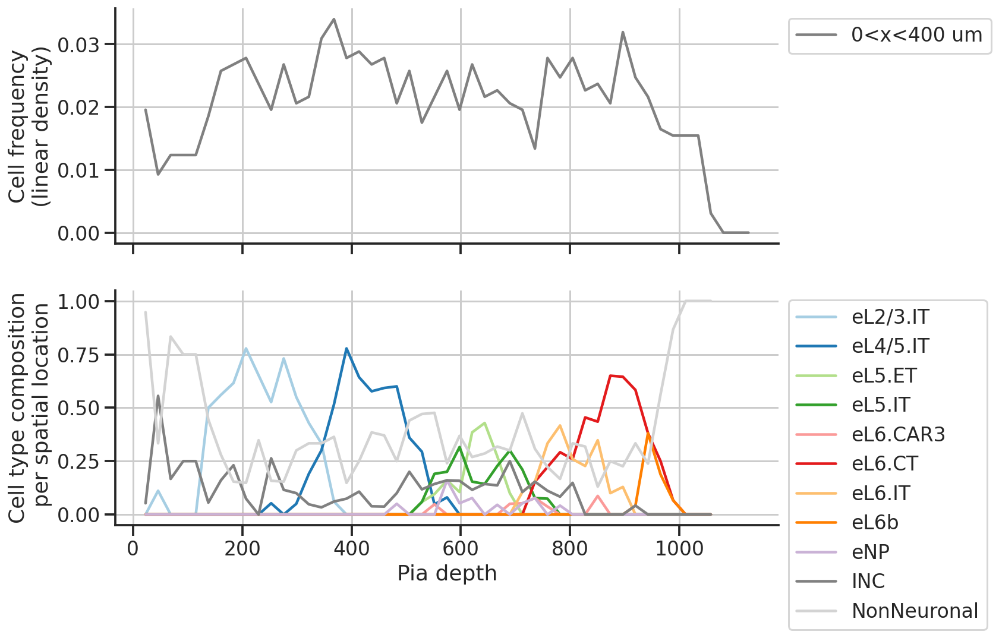

In [43]:
fig, axs = plt.subplots(2, 1, figsize=(10,4*2), sharex=True)
ax = axs[0]
# ax.plot(pia_bins[1:], metasub_totalcounts /metasub_totalcounts.sum() , '-k', label='all') #, label=col, color=palette[col])
ax.plot(pia_bins[1:], metasub2_totalcounts/metasub2_totalcounts.sum(), '-', color='gray', label='0<x<400 um', ) #, label=col, color=palette[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
# ax.set_xlabel('Pia depth')
ax.set_ylabel('Cell frequency\n(linear density)')

ax = axs[1]
for col in hybrid_clsts: #metasub_typefrac_perbin: 
    ax.plot(pia_bins[1:], metasub2_typefrac_perbin[col].values, label=col, color=palette[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
ax.set_xlabel('Pia depth')
ax.set_ylabel('Cell type composition\n per spatial location')

# check cell types
- subtypes

Text(0, 0.5, 'Cell type composition\n per spatial location')

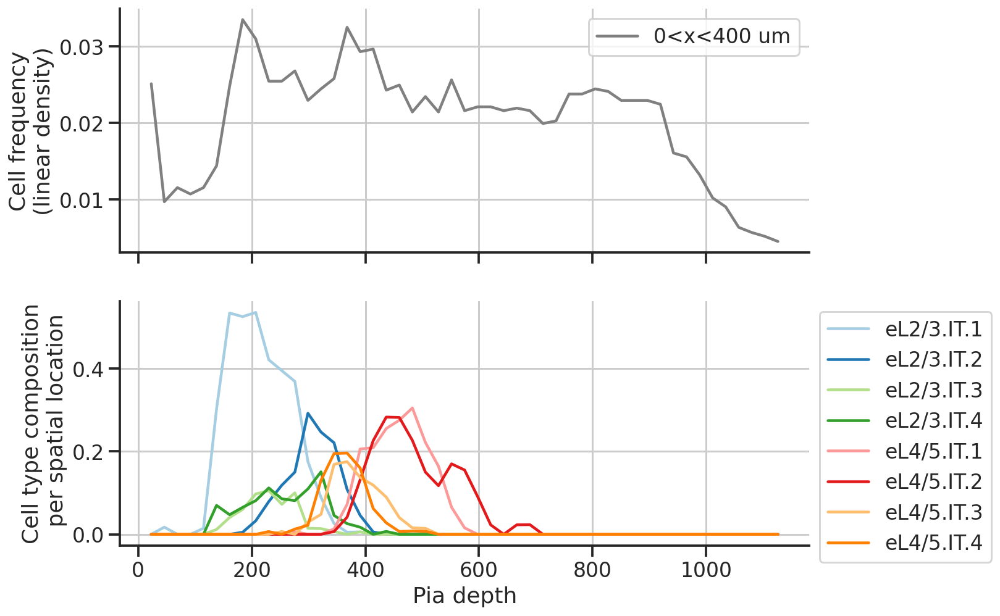

In [44]:
fig, axs = plt.subplots(2, 1, figsize=(10,4*2), sharex=True)
ax = axs[0]
ax.plot(pia_bins[1:], metasub3_totalcounts/metasub3_totalcounts.sum(), '-', color='gray', label='0<x<400 um', ) #, label=col, color=palette[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
# ax.set_xlabel('Pia depth')
ax.set_ylabel('Cell frequency\n(linear density)')

ax = axs[1]
for col in hybrid_clsts2:  
    if col not in ['EXC', 'INC', "NonNeuronal"]:
        ax.plot(pia_bins[1:], metasub3_typefrac_perbin[col].values, label=col, color=palette2[col])
ax.legend(bbox_to_anchor=(1,1))
sns.despine(ax=ax)
ax.set_xlabel('Pia depth')
ax.set_ylabel('Cell type composition\n per spatial location')

# check genes

In [45]:
genes


array(['Acta2', 'Adam2', 'Adamts2', 'Adamts4', 'Adra1b', 'Alk', 'Ankfn1',
       'Ano4', 'Aqp4', 'Asic4', 'B4galnt2', 'B4galnt3', 'Barx2', 'Bcl11b',
       'Bdnf', 'Blnk', 'Bmpr1b', 'Brinp3', 'C1ql3', 'C1qtnf7', 'Cacng5',
       'Calb2', 'Camk2d', 'Car3', 'Cbln2', 'Cbln4', 'Ccbe1', 'Ccdc162',
       'Ccdc3', 'Ccdc80', 'Ccnb1', 'Cd14', 'Cd24a', 'Cdca7', 'Cdcp1',
       'Cdh12', 'Cdh13', 'Cdh20', 'Cdh9', 'Ceacam9', 'Cemip', 'Chat',
       'Chn2', 'Chodl', 'Chrm2', 'Chrna2', 'Cldn5', 'Clrn1', 'Cntnap5b',
       'Cobll1', 'Col14a1', 'Col15a1', 'Col23a1', 'Col24a1', 'Col25a1',
       'Corin', 'Cplx3', 'Crhr2', 'Crispld2', 'Cspg4', 'Ctss', 'Cux2',
       'Cxcl14', 'Daam2', 'Dmkn', 'Dnase1l3', 'Dscaml1', 'Egfem1', 'Egfr',
       'Egln3', 'Egr2', 'Elfn1', 'Enpp6', 'Epha7', 'Fam19a2', 'Fam84b',
       'Fbxl7', 'Fezf2', 'Flrt3', 'Flt1', 'Fndc7', 'Fosb', 'Foxp2',
       'Frem2', 'Fst', 'Gfap', 'Glra1', 'Gpc6', 'Grik1', 'Grin3a', 'Grm1',
       'Grm8', 'Hpse', 'Hs3st5', 'Igf2', 'Igfbp4', 'Igfbp5',

In [46]:
easigenes = [
    'Adamts2',
    'Cdh13',
    'Chrm2',
    'Rorb',
    'Slc17a6',
    'Slc32a1',
    'Rspo1',
    'Lhx6',
    'Aqp4',
    'Sox10',
    'Flt1',
    
    # 'Cntn5',
    # 'Kcnip3',
    # 'Kcnq5',
    # 'Sorcs3',
]
easigenes = np.array([g for g in easigenes if g in genes])
easi_idx = basicu.get_index_from_array(genes, easigenes) 
easigenes, easi_idx, genes[easi_idx]

(array(['Adamts2', 'Cdh13', 'Chrm2', 'Rorb', 'Slc17a6', 'Slc32a1', 'Rspo1',
        'Lhx6', 'Aqp4', 'Sox10', 'Flt1'], dtype='<U7'),
 array([  2,  36,  44, 176, 188, 192, 177, 106,   8, 196,  79]),
 array(['Adamts2', 'Cdh13', 'Chrm2', 'Rorb', 'Slc17a6', 'Slc32a1', 'Rspo1',
        'Lhx6', 'Aqp4', 'Sox10', 'Flt1'], dtype=object))

In [47]:
# countssub = counts[easi_idx,:][:,metasub.index.values]
# print(countssub.shape) #, genes.shape

easigenes_p = np.char.add(easigenes, '+')
for i, col in enumerate(easigenes):
    metasub[col] = counts[easi_idx[i],:][metasub.index.values]
    metasub[col+'+'] = (metasub[col]>0).astype(int)

In [48]:
# metasub
metasub_mean  = metasub.groupby(['pia_depth_bin']).mean()[np.hstack([easigenes, easigenes_p])]

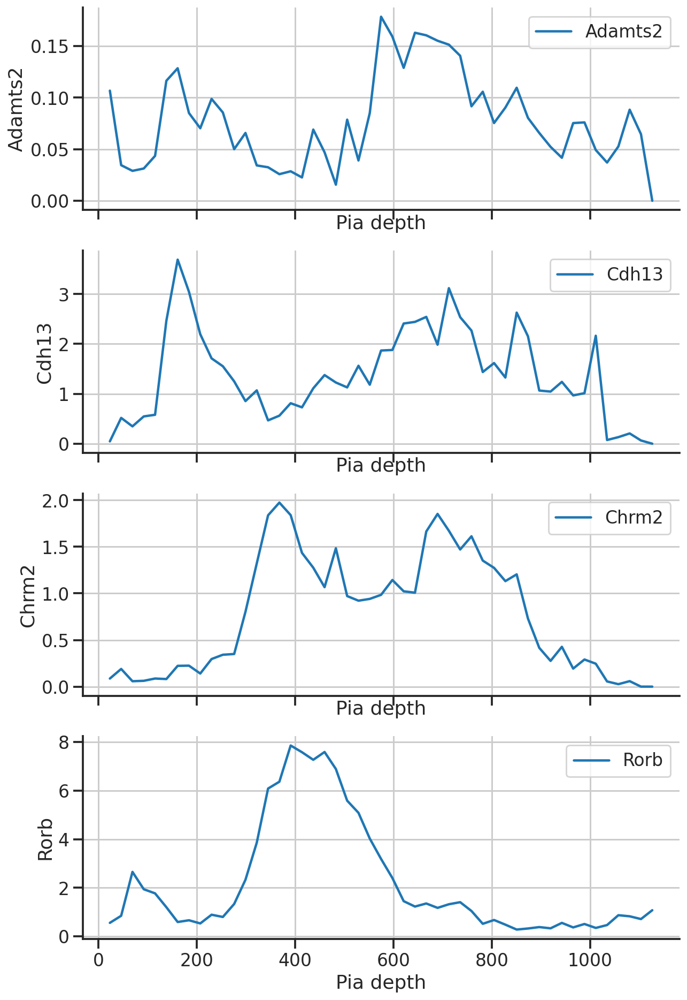

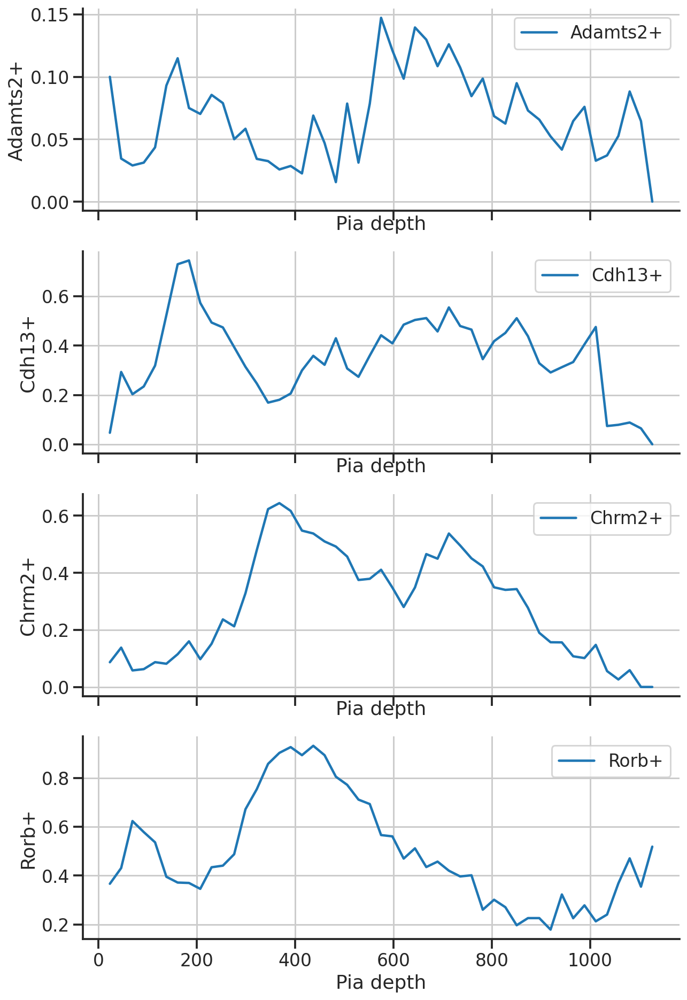

In [56]:
fig, axs = plt.subplots(4, 1, figsize=(10,4*4), sharex=True)
for col, ax in zip(easigenes, axs): #metasub_typefrac_perbin: 
    ax.plot(pia_bins[1:], metasub_mean[col].values, label=col) #, color=palette[col])
    ax.legend(bbox_to_anchor=(1,1))
    sns.despine(ax=ax)
    ax.set_xlabel('Pia depth')
    ax.set_ylabel(col)
    
fig, axs = plt.subplots(4, 1, figsize=(10,4*4), sharex=True)
for col, ax in zip(easigenes_p, axs): #metasub_typefrac_perbin: 
    ax.plot(pia_bins[1:], metasub_mean[col].values, label=col) #, color=palette[col])
    ax.legend(bbox_to_anchor=(1,1))
    sns.despine(ax=ax)
    ax.set_xlabel('Pia depth')
    ax.set_ylabel(col)

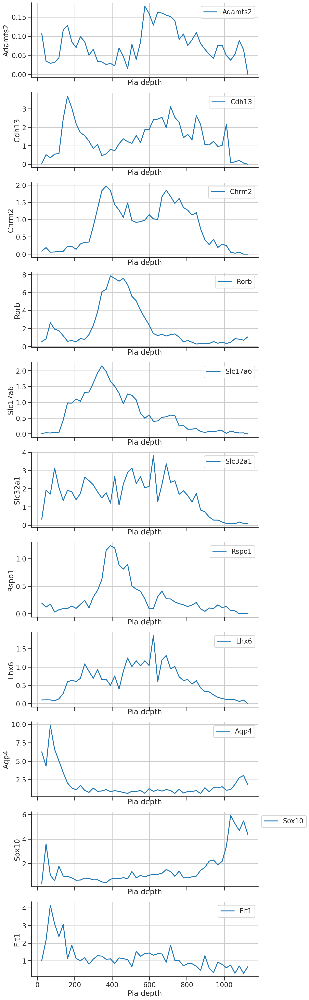

In [57]:
n = len(easigenes)
fig, axs = plt.subplots(n, 1, figsize=(10,4*n), sharex=True)
for col, ax in zip(easigenes, axs): #metasub_typefrac_perbin: 
    ax.plot(pia_bins[1:], metasub_mean[col].values, label=col) #, color=palette[col])
    ax.legend(bbox_to_anchor=(1,1))
    sns.despine(ax=ax)
    ax.set_xlabel('Pia depth')
    ax.set_ylabel(col)

Adamts2 428
Cdh13 2290
Chrm2 1960
Rorb 3079
Slc17a6 1863
Slc32a1 1922
Rspo1 1121
Lhx6 1504
Aqp4 2594
Sox10 2552
Flt1 1354


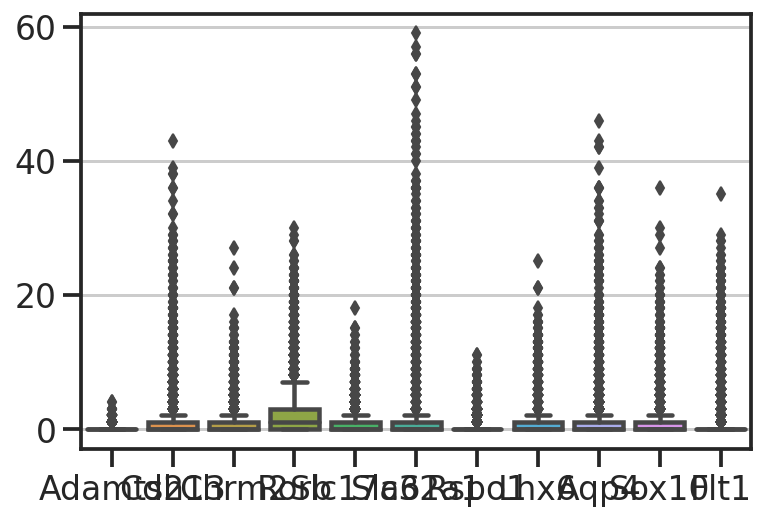

In [51]:
sns.boxplot(data=metasub[easigenes])
for col in easigenes:
    print(col, (metasub[col]>0).sum())

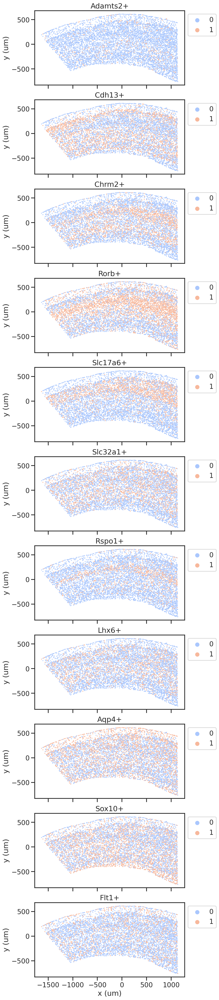

In [52]:
n = len(easigenes)
fig, axs = plt.subplots(n,1,figsize=(10,4*n), sharey=True, sharex=True)
for col, ax in zip(easigenes_p, axs):
    sns.scatterplot(data=metasub, x='x', y='y', hue=col, 
                    # hue_order=hybrid_clsts, 
                    # palette=palette,
                    palette='coolwarm',
                    s=5, edgecolor='none', ax=ax)
    ax.grid(False)
    ax.set_aspect('equal')
    ax.set_xlabel('x (um)')
    ax.set_ylabel('y (um)')
    ax.set_title(col)
    # ax.set_xticks(np.arange(-1600, 1300, 200))
    # ax.set_yticks(np.arange(-500, 701, 200))
    ax.legend(bbox_to_anchor=(1,1))

In [53]:
# subtypes

In [54]:
# easifish cells
pth_dat = '/bigstore/GeneralStorage/fangming/projects/visctx/data_dump/aug5-v2'
f_meta = os.path.join(pth_dat, 'roi.csv')
meta_easi = pd.read_csv(f_meta, index_col=0)

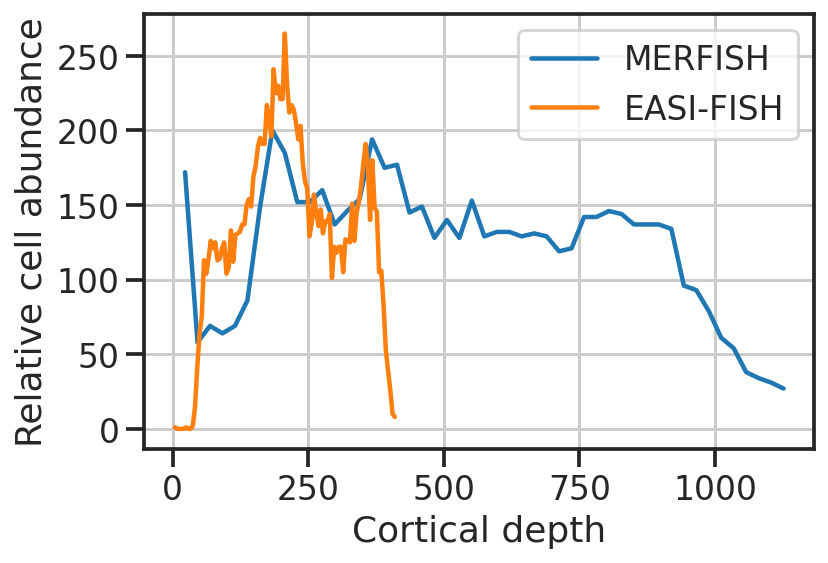

In [55]:
ys0 = metasub['pia_depth'].values
bins0 = np.linspace(np.min(ys0), np.max(ys0), 50)
ycounts0, _ = np.histogram(ys0, bins0) 

ys = meta_easi['y'].values
val = -ys
shift = np.min(val) - np.min(ys0)
val = val-shift
bins = np.linspace(np.min(val), np.max(val), 100)
ycounts, _ = np.histogram(val, bins) 

plt.plot(bins0[1:], ycounts0, label='MERFISH')
plt.plot(bins[1:], ycounts, label='EASI-FISH')
plt.xlabel('Cortical depth')
plt.ylabel('Relative cell abundance')
plt.legend()